<a href="https://colab.research.google.com/github/nicolastibata/MINE_4210_ADL_202620/blob/main/labs/Laboratorio_5/MINE_4210_ADL_202620_L5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![Logo ADL](https://github.com/nicolastibata/MINE_4210_ADL_202620/blob/main/docs/logo.png?raw=true)


# **Laboratorio 5: CNN para detección de objetos**
**Tutor: Nicolás Tibatá**

## **Tabla de Contenido**

[Contexto y objetivos](#scrollTo=R4YrUaE6udsU&line=14&uniqifier=1)<br>
[1. Comprensión de los datos](#scrollTo=VjA8zwzJvmeO&line=1&uniqifier=1)<br>
[2. Preparación de los datos](#scrollTo=kG8XHROzvuEH&line=1&uniqifier=1)<br>
[3. Modelamiento](#scrollTo=wCS6xYiU4YYs&line=1&uniqifier=1)<br>
[4. Evaluación](#scrollTo=nnCc67Uf5urd&line=1&uniqifier=1)<br>
[5. Preguntas](#scrollTo=HnWtjBcSv3yG&line=1&uniqifier=1)<br>


### **Contexto y Objetivos**

**Problema**

El monitoreo manual de la biodiversidad marina y el estado de la fauna acuática en acuarios o reservas marinas presenta serias limitaciones en costos, tiempo y escalabilidad. La identificación continua de especies como peces, tiburones, rayas o medusas resulta inviable si depende únicamente del factor humano.

Para automatizar este proceso, se requiere un sistema capaz no solo de clasificar las especies presentes en una imagen, sino de localizar con precisión múltiples organismos simultáneamente mediante bounding boxes, utilizando modelos robustos de detección con YOLO.

**Objetivos**
1. Comprender la estructura y preparación de datasets formateados para detección de objetos en formato YOLO.
2. Evaluar el rendimiento del modelo utilizando métricas propias de localización y clasificación, como mAP (mean Average Precision) e IoU (Intersection over Union).

**Datos**

Los datos los puedes consultar [aquí](https://www.kaggle.com/datasets/slavkoprytula/aquarium-data-cots).

In [ ]:
# Librerias que necesitamos para este lab
!pip install ultralytics -q

import os
import glob
import json
import random
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import tensorflow as tf
from PIL import Image as PImage
from PIL import ImageDraw
from IPython.display import display

from google.colab import files
from google.colab import userdata

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 35.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.2/66.2 kB 2.4 MB/s eta 0:00:00


### **1. Comprensión de los datos**

El dataset contiene 638 imágenes de diferentes clases como son: 'fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray'. Además nuestras clases están desbalanceadas, pues el ~80% de las detecciones son 'fish'.

Son imágenes de 1024x1024 a color, ubicados en el folder `aquarium_pretrain`.

El conjunto de datos está organizado en tres particiones principales: `train`, `valid` y `test`. Cada partición contiene dos subcarpetas:

- `images/`: Contiene las imágenes en formato `.jpg` o `.png`.  
- `labels/`: Contiene las etiquetas en formato `.txt`, donde cada archivo describe las clases y las coordenadas de las bounding boxes.  


Para entender cómo traemos los datos desde kaggle pueden revisar este [link](https://www.kaggle.com/discussions/general/51898#520673)

In [ ]:
os.environ["KAGGLE_KEY"] = userdata.get('KAGGLE_KEY')
os.environ["KAGGLE_USERNAME"] = userdata.get('KAGGLE_USERNAME')

!kaggle datasets download -d slavkoprytula/aquarium-data-cots

! unzip "aquarium-data-cots.zip"

Dataset URL: https://www.kaggle.com/datasets/slavkoprytula/aquarium-data-cots
License(s): CC-BY-SA-4.0
100% 66.6M/66.6M [00:00<00:00, 85.3MB/s]

Archive:  aquarium-data-cots.zip
  inflating: aquarium_pretrain/README.dataset.txt  
  inflating: aquarium_pretrain/README.roboflow.txt  
  inflating: aquarium_pretrain/data.yaml  
  inflating: aquarium_pretrain/test/images/IMG_2289_jpeg_jpg.rf.fe2a7a149e7b11f2313f5a7b30386e85.jpg  
  inflating: aquarium_pretrain/test/images/IMG_2301_jpeg_jpg.rf.2c19ae5efbd1f8611b5578125f001695.jpg  
  inflating: aquarium_pretrain/test/images/IMG_2319_jpeg_jpg.rf.6e20bf97d17b74a8948aa48776c40454.jpg  
  inflating: aquarium_pretrain/test/images/IMG_2347_jpeg_jpg.rf.7c71ac4b9301eb358cd4a832844dedcb.jpg  
  inflating: aquarium_pretrain/test/images/IMG_2354_jpeg_jpg.rf.396e872c7fb0a95e911806986995ee7a.jpg  
  inflating: aquarium_pretrain/test/images/IMG_2371_jpeg_jpg.rf.54505f60b6706da151c164188c305849.jpg  
  inflating: aquarium_pretrain/test/images/IMG_2379_jpeg

       count
train    448
valid    127
test      63


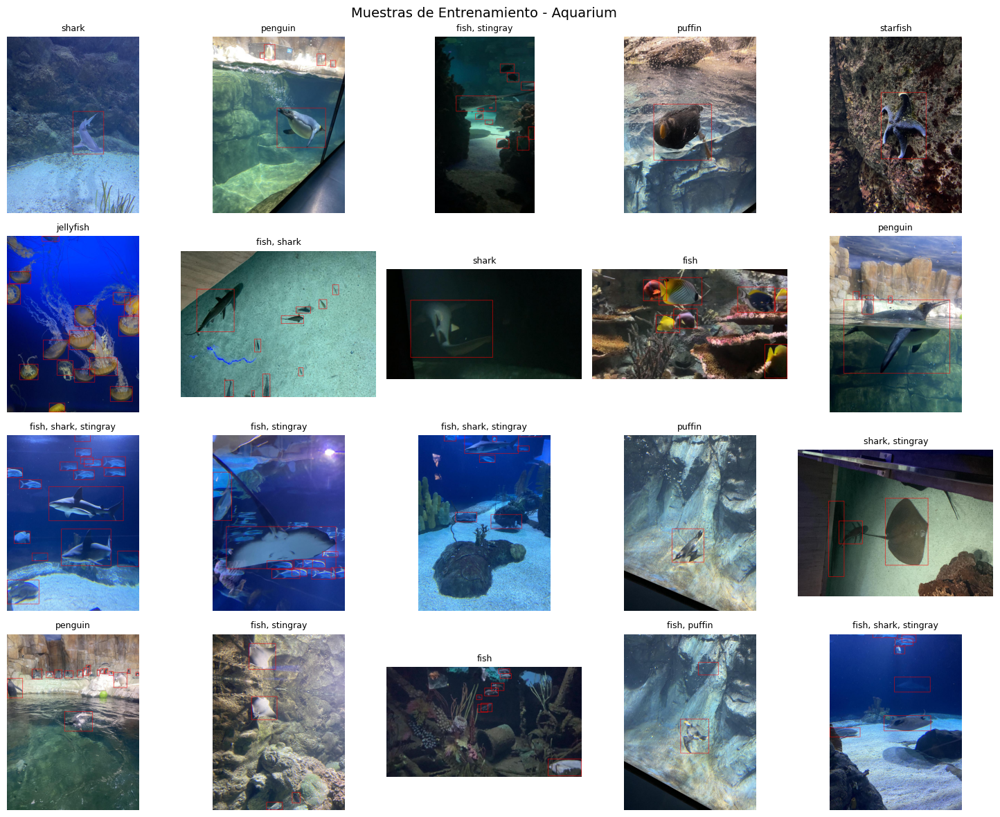

In [ ]:
# Ajuste de ruta al dataset de Aquarium
DATA_ROOT = Path('/content/aquarium_pretrain')
if not DATA_ROOT.exists():
    DATA_ROOT = Path('aquarium_pretrain')

if not DATA_ROOT.exists():
    raise FileNotFoundError(f"Ruta de datos no encontrada: {DATA_ROOT}")

root = DATA_ROOT
train_img = root / 'train' / 'images'
train_lbl = root / 'train' / 'labels'

# Clases extraídas directamente del data.yaml de Aquarium
class_names = ['fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']

# Conteo de imágenes y distribución numérica
counts = {}
for split in ['train', 'valid', 'test']:
    path = root / split / 'images'
    counts[split] = len(list(path.glob('*.*'))) if path.exists() else 0

# Mostrar tabla de distribución por split
dist = pd.Series(counts, name='count')
print(dist.to_frame())

# Visualizar muestras con bounding boxes y título de clase
population = list(train_img.glob('*.*'))
if not population:
    raise FileNotFoundError(f"No se encontraron imágenes en {train_img}")

# Tomamos hasta 20 muestras
k = min(20, len(population))
sample_images = random.sample(population, k)

n_cols = 5
n_rows = (k + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))

for ax, img_path in zip(axes.flatten(), sample_images):
    img = PImage.open(img_path).convert("RGB")
    draw = ImageDraw.Draw(img)
    w, h = img.size

    lbl_path = train_lbl / f"{img_path.stem}.txt"
    title_labels = set()
    if lbl_path.exists():
        for line in lbl_path.read_text().splitlines():
            parts = line.split()
            if not parts:
                continue
            cls, x_c, y_c, bw, bh = map(float, parts)
            # Convertir coordenadas normalized de YOLO a píxeles
            cx, cy = x_c * w, y_c * h
            bw_pix, bh_pix = bw * w, bh * h
            x1, y1 = cx - bw_pix/2, cy - bh_pix/2
            x2, y2 = cx + bw_pix/2, cy + bh_pix/2

            draw.rectangle([x1, y1, x2, y2], outline='red', width=2)
            title_labels.add(class_names[int(cls)])

    ax.imshow(img)
    ax.set_title(", ".join(sorted(title_labels)) or "Sin etiqueta", fontsize=9)
    ax.axis('off')

# Ocultar ejes sobrantes
for ax in axes.flatten()[k:]:
    ax.axis('off')

plt.suptitle('Muestras de Entrenamiento - Aquarium', fontsize=14)
plt.tight_layout()
plt.show()

### **2. Preparación de los datos**

Realizamos la configuración necesaria para que el modelo YOLO pueda utilizar el conjunto de datos. Esto incluye:

1. **Definición de las clases**: Se especifican las categorías de objetos que el modelo debe detectar. En este caso, las clases corresponden a diferentes tipos de señales de tránsito como 'fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray'.

2. **Creación del archivo YAML**: Este archivo es esencial para entrenar modelos YOLO, ya que define la estructura del conjunto de datos. Contiene información como:
   - La ruta base del conjunto de datos.
   - Las particiones de entrenamiento, validación y prueba.
   - El número total de clases (`nc`).
   - Los nombres de las clases (`names`).

El archivo YAML asegura que el modelo pueda interpretar correctamente las imágenes y etiquetas durante el entrenamiento y la evaluación.

**En nuestro caso ya existe el archivo YAML, pero podemos crearlo de cero si es necesario**

In [ ]:
# Crear animal-detection.yaml
yaml_content = f"""
path: {DATA_ROOT.absolute()}
train: train/images
val:   valid/images
test:  test/images

nc: {len(class_names)}
names: {class_names}
""".strip()
with open(DATA_ROOT / 'data.yaml', 'w') as f:
    f.write(yaml_content)

In [ ]:
print(yaml_content)

path: /content/aquarium_pretrain
train: train/images
val:   valid/images
test:  test/images

nc: 7
names: ['fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']


### **3. Modelamiento**

YOLO (“You Only Look Once”) cambió el paradigma de la detección de objetos al combinar en una sola red la localización y clasificación de instancias, evitando las etapas separadas de propuestas y refinamiento de métodos como R-CNN. Fue introducido por Redmon et al. en 2016 en *“You Only Look Once: Unified, Real-Time Object Detection”* ([ver paper](https://arxiv.org/abs/1506.02640)). Su flujo de datos se compone de:

1. **Backbone**  
   Una CNN profunda que extrae mapas de características a varios niveles de abstracción. En las familias modernas de YOLO suele emplearse CSPDarknet, que reduce la redundancia de gradiente y acelera el entrenamiento.

2. **Neck**  
   Una red de agregación multiescala (por ejemplo PANet o BiFPN) que fusiona los mapas del Backbone para capturar tanto objetos pequeños como grandes de forma eficiente.

3. **Head**  
   La capa final divide el mapa en una cuadrícula y, para cada celda, predice varias cajas delimitadoras, su confianza y la distribución de clases. Aplica Non-Max Suppression para filtrar solapamientos.

> A modo de ejemplo, la siguiente ilustración muestra el esquema general de YOLOv11, con sus tres bloques principales:
>  
> ![Arquitectura YOLOV11](https://miro.medium.com/v2/resize:fit:1100/format:webp/1*L8rMuwurmyBH1ixIqcrMSQ.png)  

**Variantes de YOLOv11**

Para distintos balances de velocidad y precisión, YOLOv11 ofrece cinco tamaños preentrenados:

| Variante      | Parámetros aproximados | Uso recomendado                         |
|---------------|------------------------|-----------------------------------------|
| **v11n** (nano)   | ~2.6 M                   | Dispositivos edge, prototipado rápido    |
| **v11s** (small)  | ~9.4 M                   | Móviles, aplicaciones con recursos limitados |
| **v11m** (medium) | ~20.1 M                  | GPU de nivel medio, tareas generales     |
| **v11l** (large)  | ~25.3 M                  | Servidores potentes, máxima precisión     |
| **v11x** (XL)     | ~56.9 M                  | Investigación o despliegue en datacenter  |

En este laboratorio emplearemos **YOLOv11s**, que ofrece un buen compromiso entre velocidad de entrenamiento, latencia de inferencia y calidad de detección.


In [ ]:
from ultralytics import YOLO

# Cargar modelo base (small)
model = YOLO('yolo11s.pt')

# Entrenar
results = model.train(
    data=str(root / 'data.yaml'),
    epochs=50,
    imgsz=1024,
    batch=16,
    patience=5,
    name='aquarium_yolov11s'
)

Ultralytics 8.4.138 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/aquarium_pretrain/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1024, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=aquarium_yolov11s, nbs=64

### **4. Evaluación**

YOLO guarda las curvas de entrenamiento y la matriz de confusión en runs/detect/car_yolov11s/.

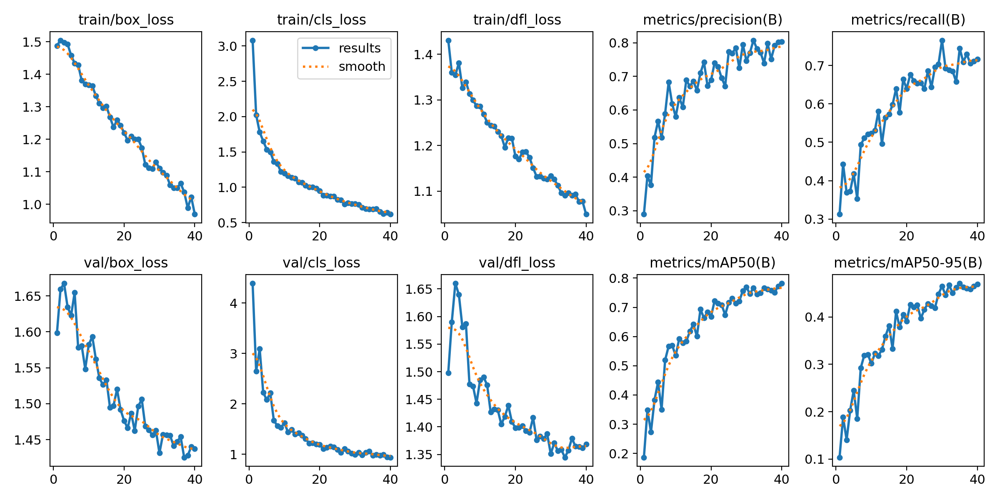

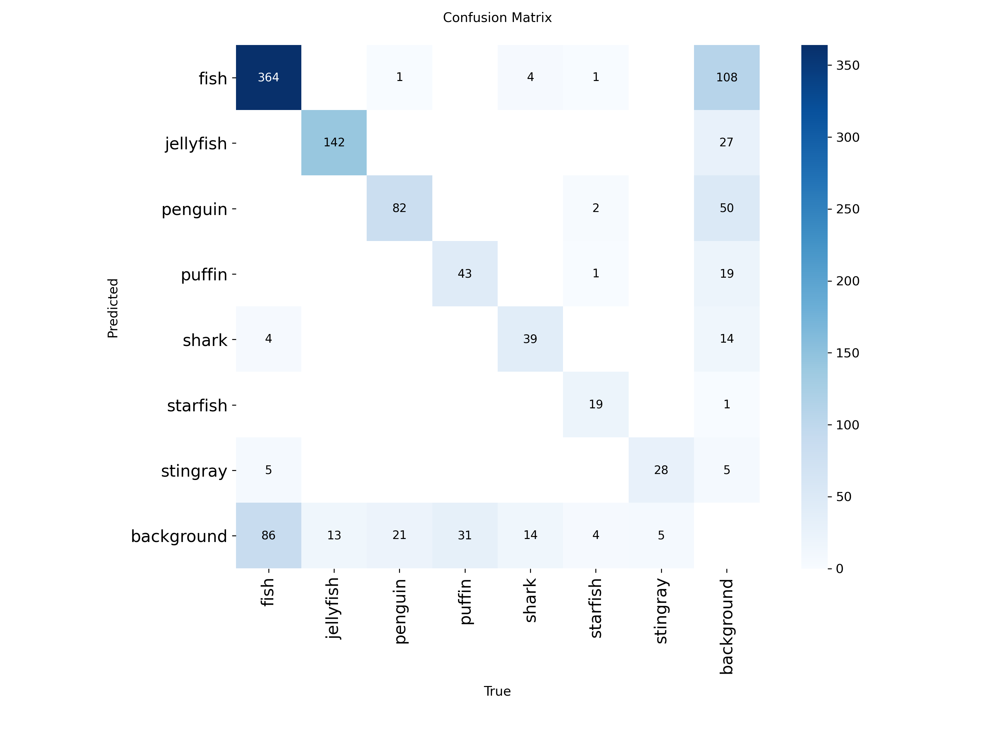

In [ ]:
# Mostrar curva de mAP y loss
display(PImage.open('runs/detect/aquarium_yolov11s/results.png'))
# Matriz de confusión
display(PImage.open('runs/detect/aquarium_yolov11s/confusion_matrix.png'))

Ultralytics 8.4.138 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1868.5±531.6 MB/s, size: 76.3 KB)
val: Scanning /content/aquarium_pretrain/test/labels.cache... 63 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 63/63 29.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.2s/it 4.8s
                   all         63        584      0.815      0.731      0.807      0.497
                  fish         30        249      0.852      0.716      0.799      0.498
             jellyfish         11        154      0.848      0.864      0.912      0.562
               penguin          7         82      0.872      0.744      0.821      0.357
                puffin          6         35      0.788      0.457      0.558      0.296
                 shark         14         38      0.773      0.789      0.841      0.576
              starfish          5  

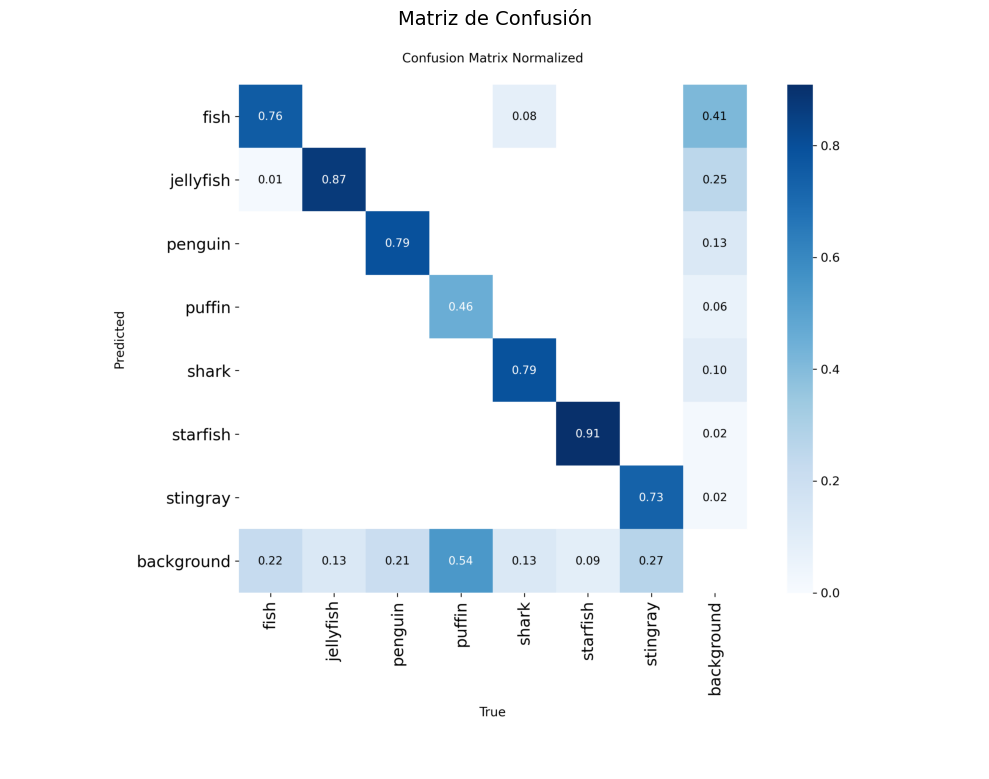

In [ ]:
# Evaluemos con test split
metrics = model.val(data=str(root / 'data.yaml'), split='test')

# Creamos nuestro Resumen General
print("=" * 45)
print("  Rendimiento General del Modelo (Test Split)")
print("=" * 45)
print(f"Precision (P):         {metrics.box.mp:.4f}")
print(f"Recall (R):            {metrics.box.mr:.4f}")
print(f"mAP @ IoU=0.50:        {metrics.box.map50:.4f}")
print(f"mAP @ IoU=0.50:0.95:   {metrics.box.map:.4f}")
print("=" * 45)

# Construimos las tablas por clase usando las métricas extraídas directamente
class_metrics = []
names = list(metrics.names.values())

# Extraer AP por clase a IoU 0.50 desde el tensor all_ap [clases, umbrales_iou]
ap50_per_class = metrics.box.all_ap[:, 0] if hasattr(metrics.box, 'all_ap') else metrics.box.maps

for i, class_name in enumerate(names):
    class_metrics.append({
        'Especie': class_name,
        'Precision': metrics.box.p[i],
        'Recall': metrics.box.r[i],
        'mAP50': ap50_per_class[i],
        'mAP50-95': metrics.box.maps[i]
    })

df_metrics = pd.DataFrame(class_metrics)
print("\n--- Rendimiento por Categoría ---")
print(df_metrics.to_string(index=False))

# Mostramos la Matriz de Confusión
save_dir = Path(metrics.save_dir)
confusion_matrix_path = save_dir / 'confusion_matrix.png'

# Si existe la versión normalizada, la graficamos para mejor entendimiento
confusion_matrix_norm_path = save_dir / 'confusion_matrix_normalized.png'
target_path = confusion_matrix_norm_path if confusion_matrix_norm_path.exists() else confusion_matrix_path

if target_path.exists():
    plt.figure(figsize=(10, 8))
    img = plt.imread(target_path)
    plt.imshow(img)
    plt.title('Matriz de Confusión', fontsize=14, pad=12)
    plt.axis('off')
    plt.tight_layout()
    plt.show()
else:
    print(f"\nNo se encontró la imagen de la matriz de confusión en: {save_dir}")

**Predicción e Inferencia**

Results saved to /content/runs/detect/aquarium_yolov11s_predict


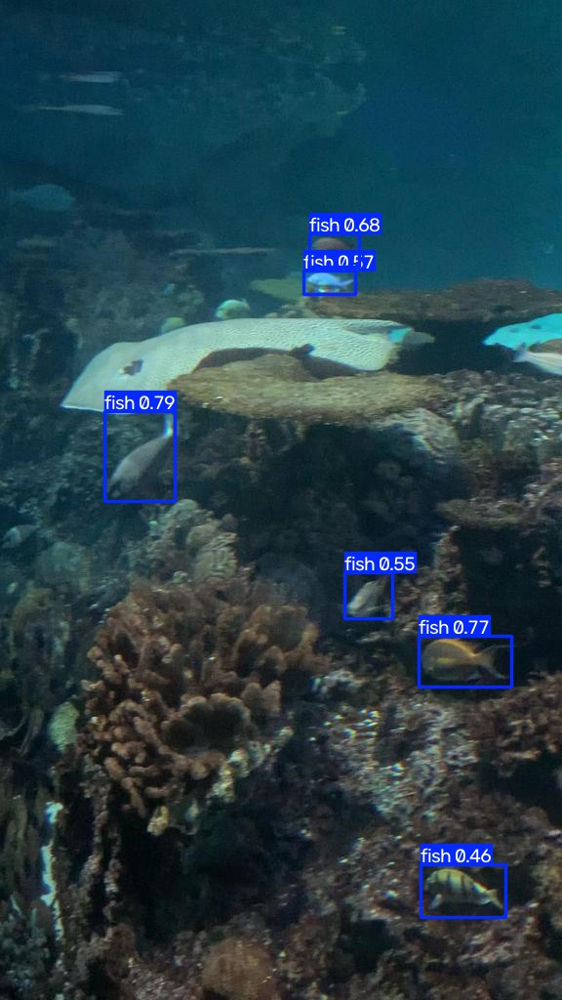

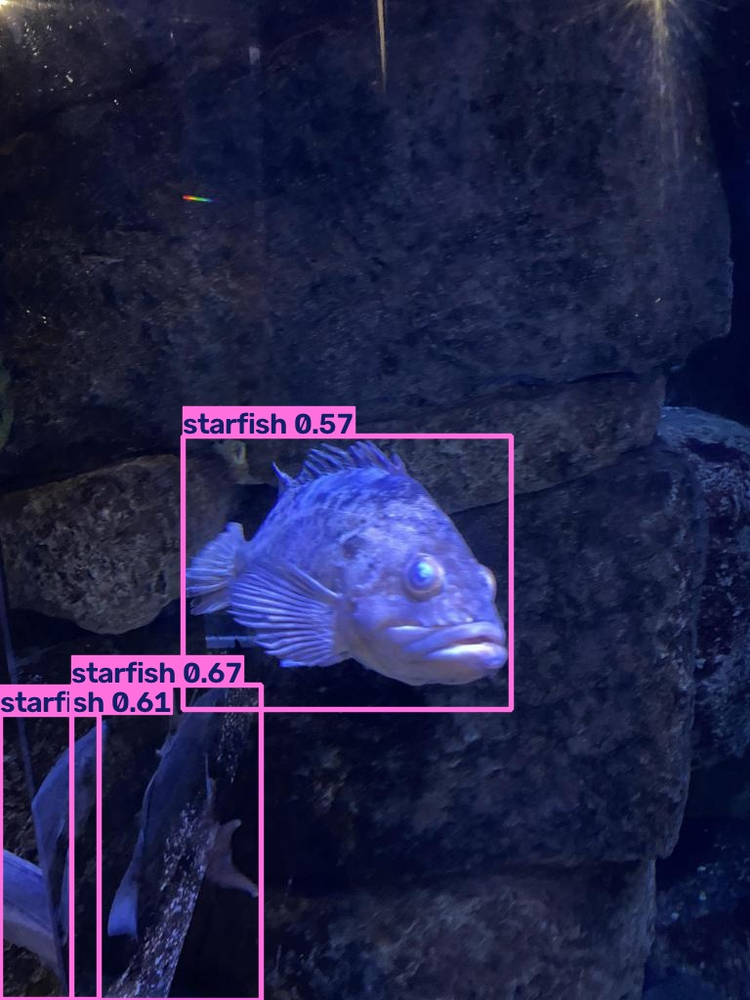

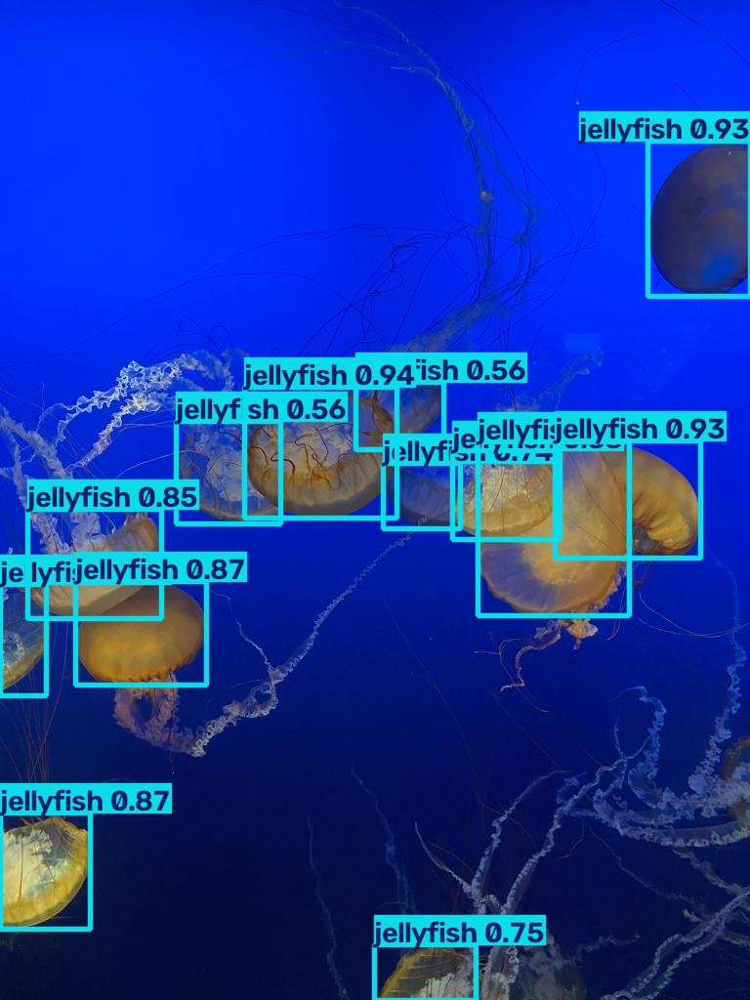

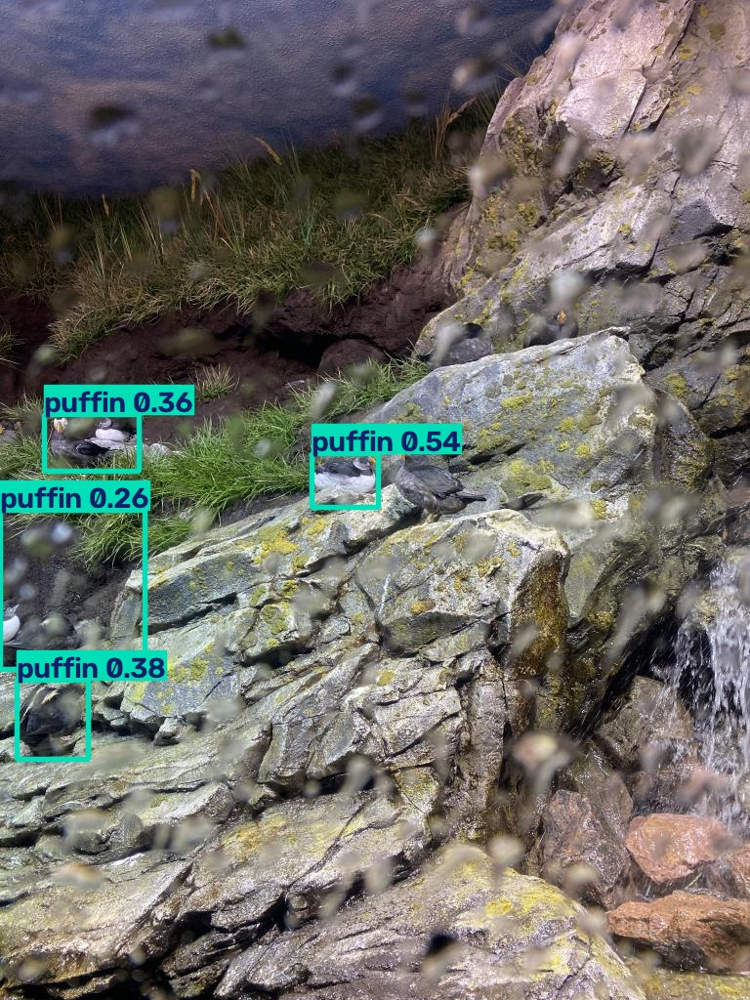

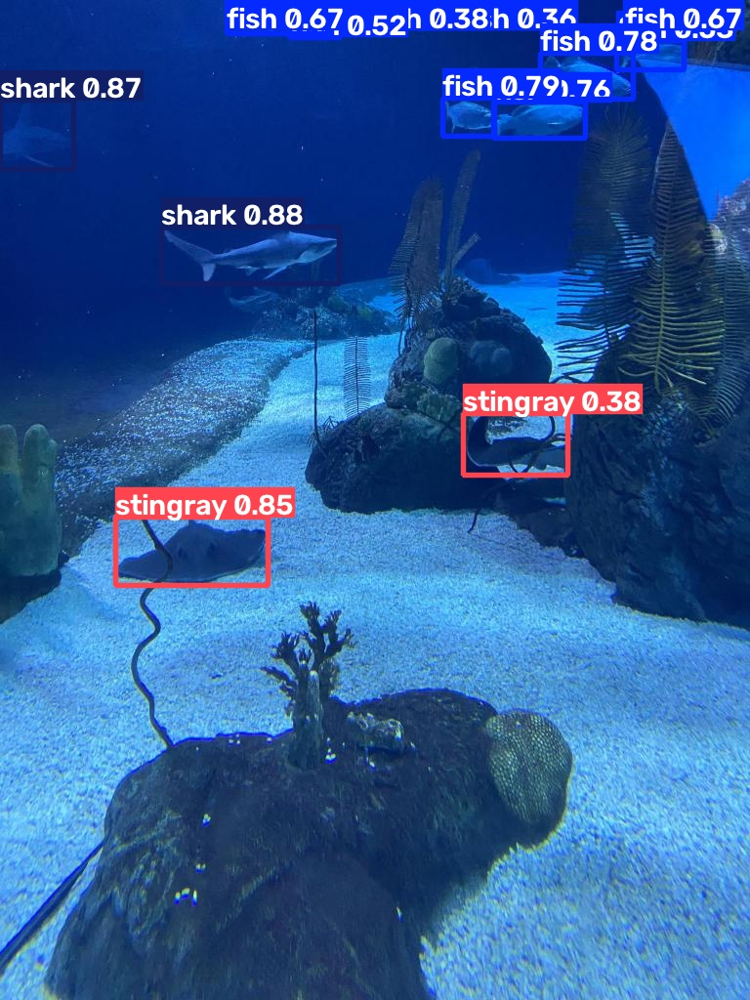

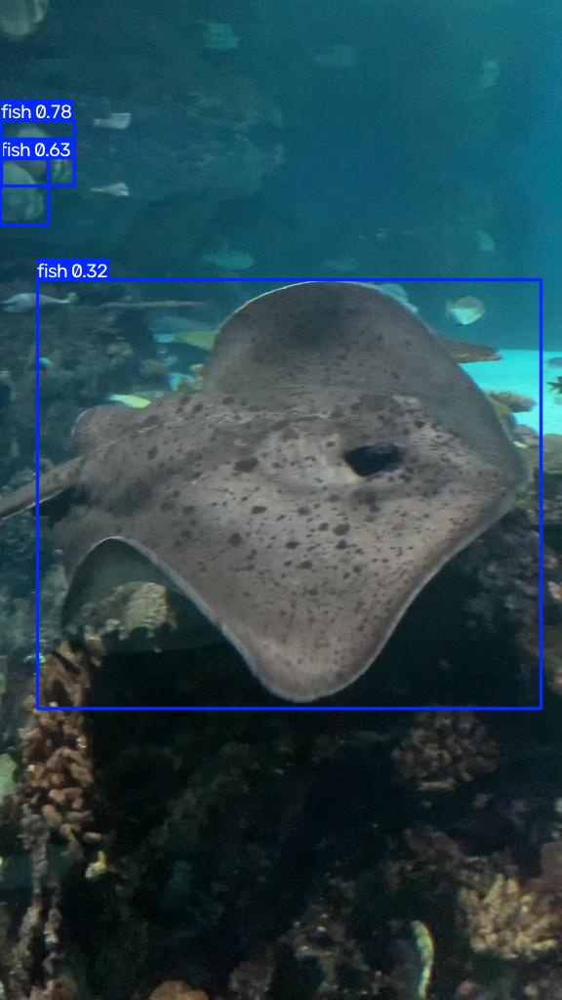

In [ ]:
# Inferencia
preds = model.predict(
    source=str(root / 'test' / 'images'),
    conf=0.25,
    save=True,
    name='aquarium_yolov11s_predict',
    verbose=False  # Suprimir mensajes en la consola
)

# Mostrar algunas predicciones
files = glob.glob('runs/detect/aquarium_yolov11s_predict/*.jpg')
for img in random.sample(files, 6):
    display(PImage.open(img))

### **5. Preguntas**

1. Prueba el modelo `v11n` y `v11m`, qué diferencias encuentras en los resultados?


2. Cómo se interpreta las métricas mAP (mean Average Precision) e IoU (Intersection over Union) del modelo mostrado en el laboratorio?